# **Second homework**

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

This function help us to show the images as quick as is't possible and of cousre easier.

You can import more images in **list** type and with **subplot entry** to make a gallery of your content, too.

The default size of output images is 5, and the axis's lables are off.

As it's shown in func, at first I extract the size of image's scale. In this part we have to be sure that every pictures (if we have multiple image) have the same size. The other part there is no important isues to be care; The another thing is we have to convert the color from BGR to RGB for have a correct image.

In [2]:
def imshow(title= [""], image= None, size= 5, axixEn= False, subplot= [1, 1]):
    if (subplot[0] > 1) | (subplot[1] > 1):
      w, h = image[0].shape[0], image[0].shape[1]
      aspect_ratio = w/h
      fig, axes = plt.subplots(subplot[0], subplot[1], figsize= (size * aspect_ratio,size))
      for i, ax in enumerate(axes.flatten()):
          ax.imshow(cv2.cvtColor(image[i], cv2.COLOR_BGR2RGB))
          if len(title) > 1:
            ax.set_title(title[i])
          ax.tick_params(left= False, labelleft= False , labelbottom= False, bottom= False)
      plt.tight_layout()
    
    else:
      w, h = image.shape[0], image.shape[1]
      aspect_ratio = w/h
      plt.figure(figsize= (size * aspect_ratio,size)) 
      plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
      plt.title(title)
      if axixEn == False:
        plt.tick_params(left= False, labelleft= False , labelbottom= False, bottom= False)
      plt.show()

## Question 1


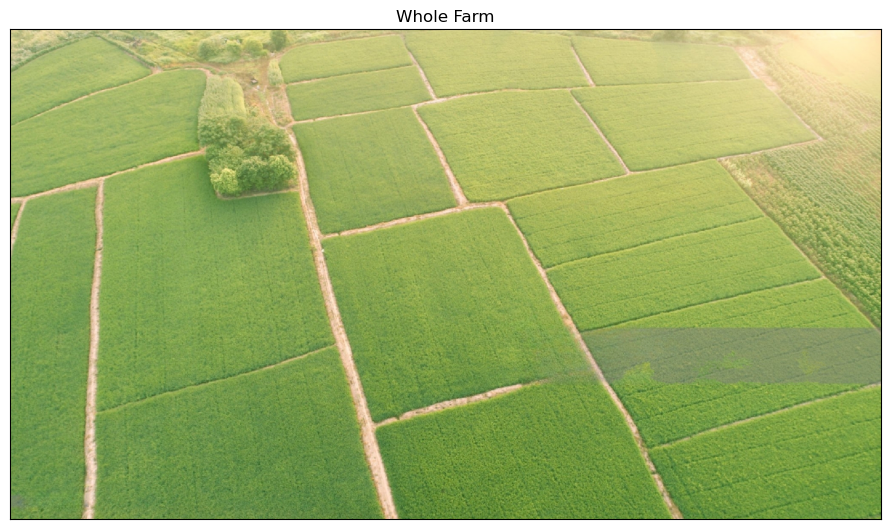

In [3]:
img = cv2.imread('AerialView.jpeg')
img = img.astype(np.uint8)

imshow('Whole Farm', img, size= 20)

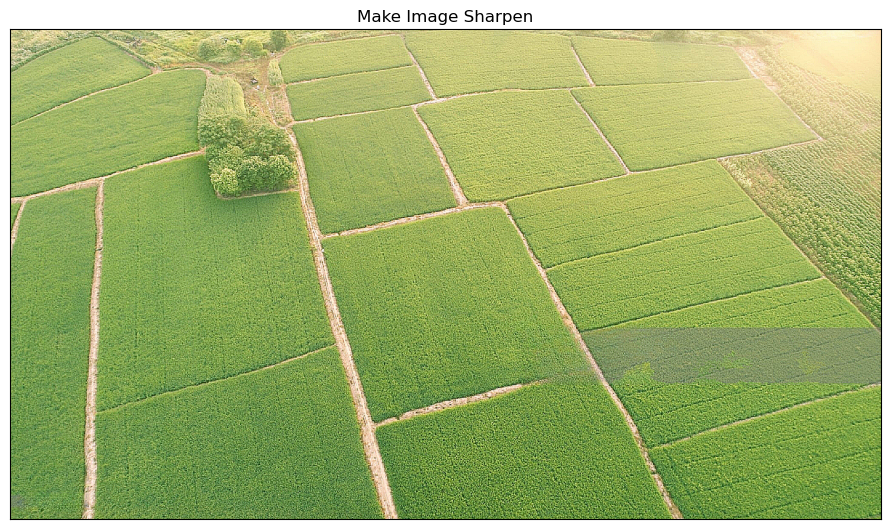

In [441]:
sharpenKernel = np.array([[-1, -1, -1], 
                          [-1, 9, -1],
                          [-1, -1, -1]])
sharpenImg = cv2.filter2D(img, -1, sharpenKernel)

imshow('Make Image Sharpen', sharpenImg, size= 20)

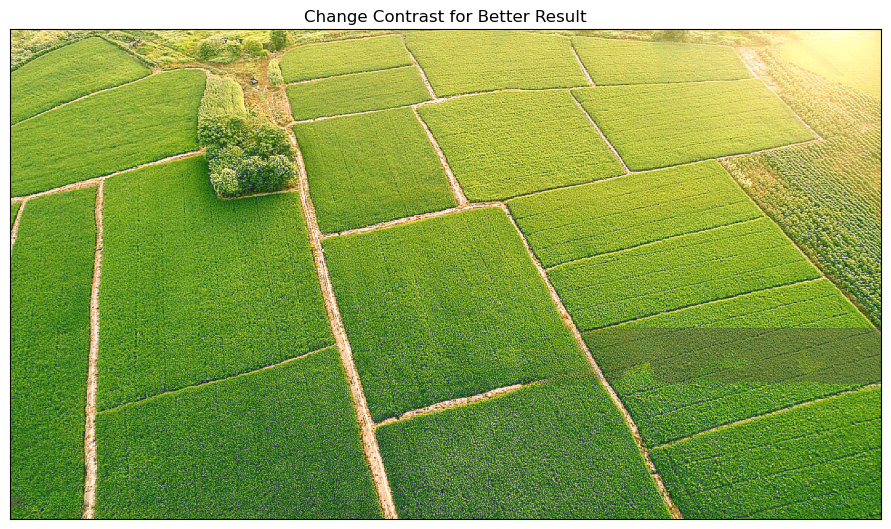

In [442]:
alpha = 1.5 # Contrast control
beta = -100 # Brightness control

adjustedImg = cv2.convertScaleAbs(sharpenImg, alpha=alpha, beta=beta)

imshow('Change Contrast for Better Result', adjustedImg, size= 20)

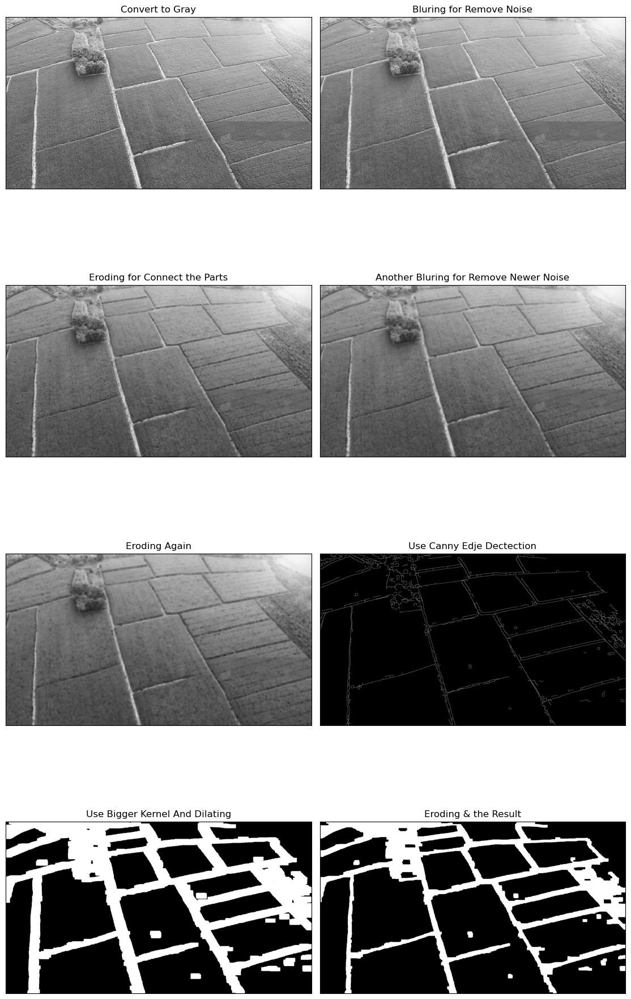

In [444]:
big_kernel1 = np.ones([25, 55], dtype= float)
big_kernel2 = np.ones([5, 20], dtype= float)
small_kernel = np.ones([3, 3], dtype= float)
image = []
title = []

grayImg = cv2.cvtColor(adjustedImg, cv2.COLOR_BGR2GRAY)
image.append(grayImg)
title.append("Convert to Gray")

grayImgBlur = cv2.GaussianBlur(grayImg, (7, 7), 2)
image.append(grayImgBlur)
title.append("Bluring for Remove Noise")

grayImgErode = cv2.erode(grayImgBlur, small_kernel, iterations= 3)
image.append(grayImgErode)
title.append("Eroding for Connect the Parts")

grayImgBlur = cv2.GaussianBlur(grayImgErode, (7, 7), 2)
image.append(grayImgBlur)
title.append("Another Bluring for Remove Newer Noise")

grayImgErode = cv2.erode(grayImgBlur, small_kernel, iterations= 2)
image.append(grayImgErode)
title.append("Eroding Again")

edged = cv2.Canny(grayImgErode, 20, 80)
image.append(edged)
title.append("Use Canny Edje Dectection")

edged = cv2.dilate(edged, big_kernel1, iterations= 1)
image.append(edged)
title.append("Use Bigger Kernel And Dilating")

edged = cv2.erode(edged, big_kernel2, iterations= 2)
image.append(edged)
title.append("Eroding & the Result")

imshow(title, image, size= 20, subplot= [4, 2]) 

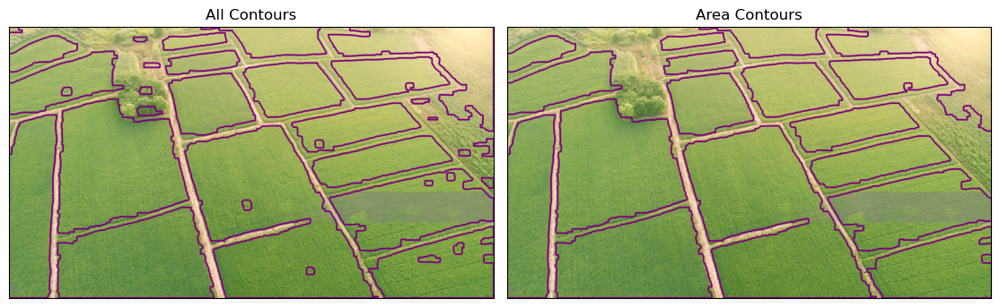

In [445]:
contoursImg = img.copy()
#Minimum area to filter out small contours
minArea = 10000
newContours = []
image = []
title = []

contours, _ = cv2.findContours(image = cv2.bitwise_not(edged), mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
cv2.drawContours(contoursImg, contours, -1, (125, 0, 125), thickness = 5)
image.append(contoursImg)
title.append("All Contours")

for c in contours:
    if cv2.contourArea(c) > minArea:
        newContours.append(c)
contoursImg = img.copy()
cv2.drawContours(contoursImg, newContours, -1, (125, 0, 125), thickness = 5)
image.append(contoursImg)
title.append("Area Contours")

imshow(title, image, size= 20, subplot= [1, 2])

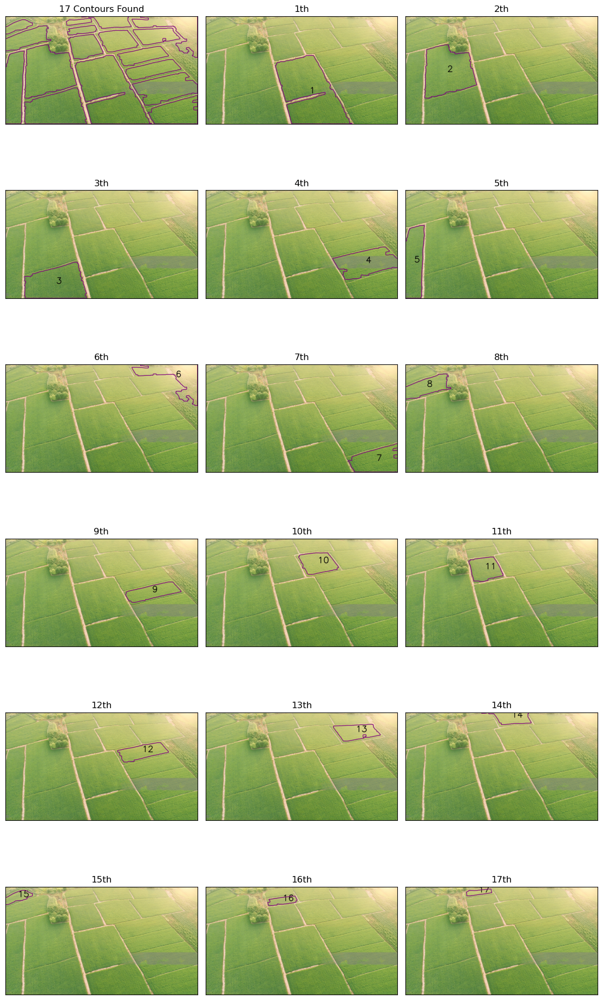

In [446]:
image = []
title = []
image.append(contoursImg)
title.append(f"{len(newContours)} Contours Found")

sorted_contours = sorted(newContours, key=cv2.contourArea, reverse=True)

for (i,c) in enumerate(sorted_contours):
    contoursImg = img.copy()
    M = cv2.moments(c)
    cx = int(M['m10'] / M['m00'])
    cy = int(M['m01'] / M['m00'])
    cv2.putText(contoursImg, str(i+1), (cx, cy), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 0), 5)
    cv2.drawContours(contoursImg, [c], -1, (125, 0, 125), thickness = 5)
    image.append(contoursImg)
    title.append(f"{i+1}th")

imshow(title, image, size= 20, subplot= [6, 3])

## Question 2

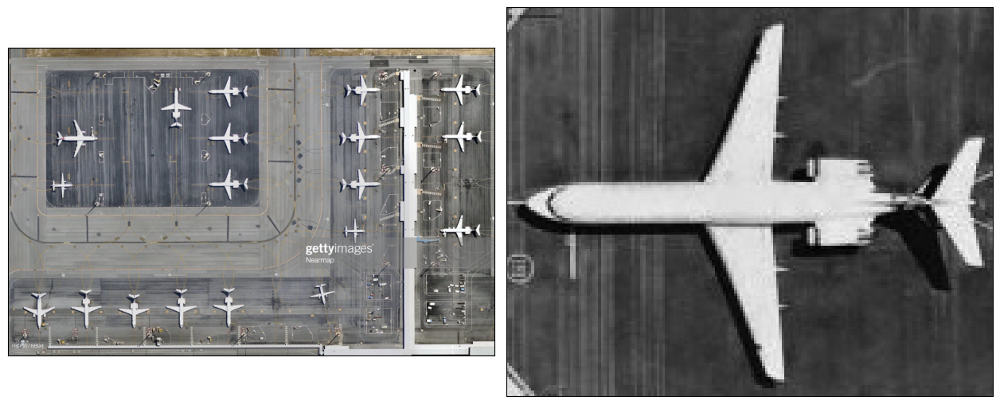

In [447]:
img = cv2.imread('airport.jpg')
tempImg = cv2.imread('plane_template.jpg')

imshow(image= [img, tempImg], size= 20, subplot= [1, 2])

In [448]:
grayImg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
grayTempImg = cv2.cvtColor(tempImg, cv2.COLOR_BGR2GRAY)

In [449]:
finedItems = []

def imageRotate(image, angle):
  image_center = tuple(np.array(image.shape[1::-1]) / 2)
  rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
  result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags= cv2.INTER_LINEAR)
  return result

def detectPlanes(image, tempImage, threshold):
  result = cv2.matchTemplate(image, tempImage, cv2.TM_CCOEFF_NORMED)
  locs = np.where(result >= threshold)
  for pt in zip(*locs[::-1]):
    finedItems.append((int(pt[0]), int(pt[1]), int(tempImage.shape[1]), int(tempImage.shape[0])))

rotation_angles = list(range(0, 360, 10))
scaling_factors = list(range(6, 12, 2))
threshold = 0.52

In [450]:
for angle in rotation_angles:
    tempImgRotate = imageRotate(grayTempImg, angle)

    for scale in scaling_factors:
        tempImgResize = cv2.resize(tempImgRotate, None, fx= scale / 10, fy= scale / 10)
        detectPlanes(grayImg, tempImgResize, threshold)

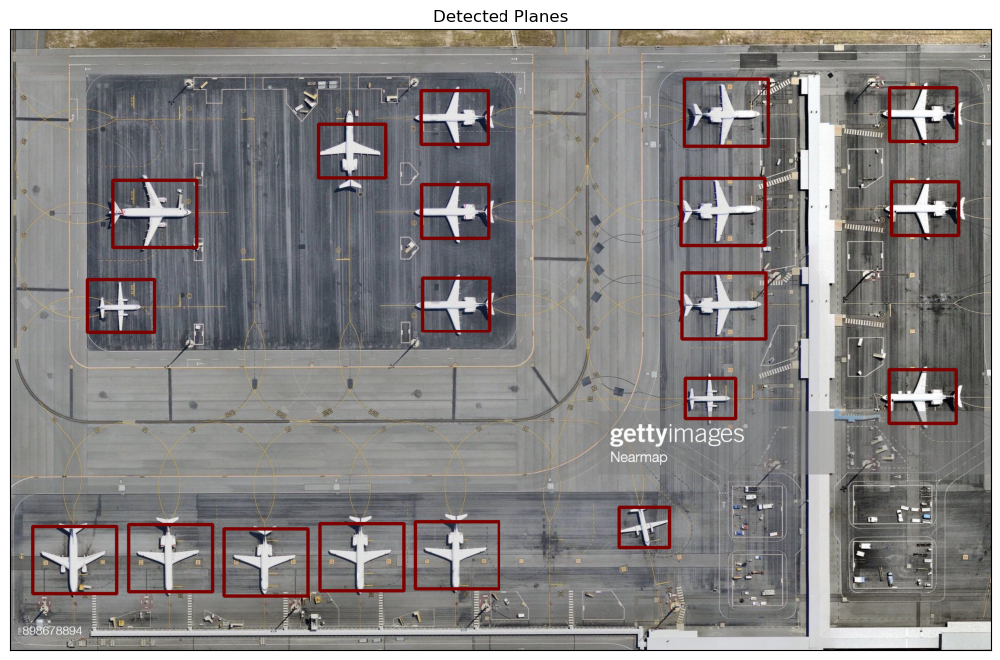

In [451]:
detectedImg = img.copy()
rect = []
for i, rec in enumerate(finedItems):
    ISDUPLICATE  = False
    rect1 = rec

    for j in range(i+1, len(finedItems)):
        rect2 = finedItems[j]
        error = abs(rect1[0]-rect2[0]) + abs(rect1[1]-rect2[1])
        if error <= 150:
            ISDUPLICATE = True
            break
    
    if not(ISDUPLICATE):
        rect.append(rect1)

for rec in rect:
    x, y, w, h = rec
    cv2.rectangle(detectedImg, (x , y) , (x+w , y+h), (0, 0, 125), 5)


imshow("Detected Planes", detectedImg, size= 20)

## Question 3

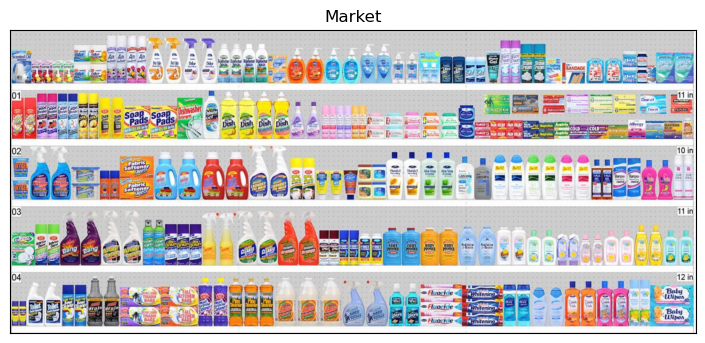

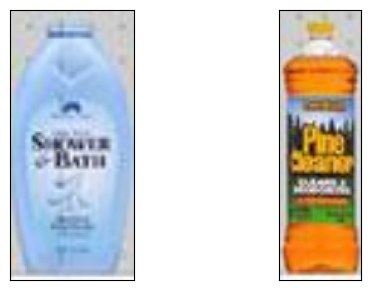

In [452]:
img = cv2.imread('market.jpg')
tempImg1 = cv2.imread('shampoo.png')
tempImg2 = cv2.imread('oil.png')

imshow("Market", image= img, size= 20)
imshow(image= [tempImg1, tempImg2], size= 3, subplot= [1, 2])

In [453]:
grayImg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
grayTempImg1 = cv2.cvtColor(tempImg1, cv2.COLOR_BGR2GRAY)
grayTempImg2 = cv2.cvtColor(tempImg2, cv2.COLOR_BGR2GRAY)

In [454]:
obj1 = []
def detectObj1(image, tempImage, threshold):
  result = cv2.matchTemplate(image, tempImage, cv2.TM_CCOEFF_NORMED)
  locs = np.where(result >= threshold)
  for pt in zip(*locs[::-1]):
    obj1.append((int(pt[0]), int(pt[1]), int(tempImage.shape[1]), int(tempImage.shape[0])))

obj2 = []
def detectObj2(image, tempImage, threshold):
  result = cv2.matchTemplate(image, tempImage, cv2.TM_CCOEFF_NORMED)
  locs = np.where(result >= threshold)
  for pt in zip(*locs[::-1]):
    obj2.append((int(pt[0]), int(pt[1]), int(tempImage.shape[1]), int(tempImage.shape[0])))

threshold = 0.9

In [455]:
def deleteDuplicated(obj):
    rect = []
    for i, rec in enumerate(obj):
        ISDUPLICATE  = False
        rect1 = rec

        for j in range(i+1, len(obj)):
            rect2 = obj[j]
            error = abs(rect1[0]-rect2[0]) + abs(rect1[1]-rect2[1])
            if error <= 10:
                ISDUPLICATE = True
                break
        
        if not(ISDUPLICATE):
            rect.append(rect1)
    return rect
    

In [456]:
detectObj1(grayImg, grayTempImg1, threshold)
detectObj2(grayImg, grayTempImg2, threshold)

obj1 = deleteDuplicated(obj1)
obj2 = deleteDuplicated(obj2)

2 shampoo is found in market
3 oil is found in market


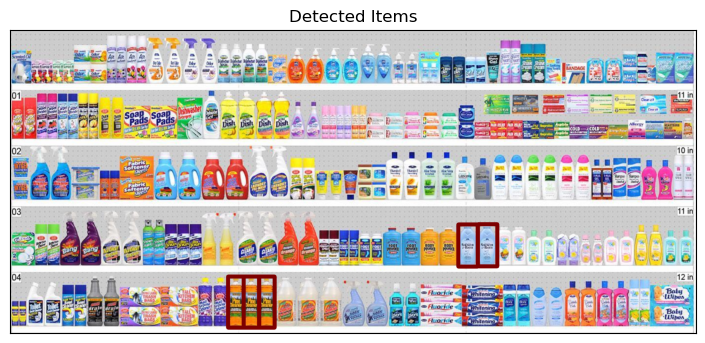

In [457]:
detectedImg = img.copy()

for rec in obj1:
    x, y, w, h = rec
    cv2.rectangle(detectedImg, (x, y) , (x+w, y+h), (0, 0, 125), 15)

for rec in obj2:
    x, y, w, h = rec
    cv2.rectangle(detectedImg, (x, y) , (x+w, y+h), (0, 0, 125), 15)

print(f"{len(obj1)} shampoo is found in market")
print(f"{len(obj2)} oil is found in market")

imshow("Detected Items", detectedImg, size= 20)